In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

# from kaggle_datasets import KaggleDatasets
import matplotlib.pyplot as plt
import numpy as np
import time

In [ ]:
!pip install -q git+https://github.com/tensorflow/examples.git

In [ ]:
from tensorflow_examples.models.pix2pix import pix2pix

In [ ]:
# Attempting to connect to a TPU cluster and configurating it
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Device:', tpu.master())
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.TPUStrategy(tpu)
    # strategy = tf.distribute.experimental.TPUStrategy(tpu)

except:
    print("Connection failed.")
    strategy = tf.distribute.get_strategy()
  
print('Number of replicas:', strategy.num_replicas_in_sync)

AUTOTUNE = tf.data.experimental.AUTOTUNE
    
print(tf.__version__)

Connection failed.
Number of replicas: 1
2.3.0


In [ ]:
# Setting up the paths to the .tfrec files from the dataset
# MONET_PATH = "./dataset/monet/"
# PHOTO_PATH = "./dataset/photo/"

MONET_TRAIN_PATH = "/content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/Dataset/alt-monet-tfrecord/train/"
MONET_TEST_PATH = "/content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/Dataset/alt-monet-tfrecord/test/"
# MONET_PATH = "/content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/Dataset/monet_tfrec/"
PHOTO_TRAIN_PATH = "/content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/Dataset/alt-photos-tfrecord/train/"
PHOTO_TEST_PATH = "/content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/Dataset/alt-photos-tfrecord/test/"

In [ ]:
# Loading the dataset filenames to use them in our models later on
MONET_TRAIN_FILENAMES = tf.io.gfile.glob(str(MONET_TRAIN_PATH + "*.tfrec"))
print('Monet train TFRecord Files:', len(MONET_TRAIN_FILENAMES))
MONET_TEST_FILENAMES = tf.io.gfile.glob(str(MONET_TEST_PATH + "*.tfrec"))
print('Monet TEST TFRecord Files:', len(MONET_TEST_FILENAMES))

PHOTO_TRAIN_FILENAMES = tf.io.gfile.glob(str(PHOTO_TRAIN_PATH + "*.tfrec"))
print('Photos train TFRecord Files:', len(PHOTO_TRAIN_FILENAMES))
PHOTO_TEST_FILENAMES = tf.io.gfile.glob(str(PHOTO_TEST_PATH + "*.tfrec"))
print('Photos test TFRecord Files:', len(PHOTO_TEST_FILENAMES))

Monet train TFRecord Files: 4
Monet TEST TFRecord Files: 1
Photos train TFRecord Files: 4
Photos test TFRecord Files: 1


In [ ]:
# Auxiliary functions to manage the tfrecords
IMAGE_SIZE = [256, 256]

# Adjusting the image dimensions and scale
def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

# Parsing each element of the dataset
def read_tfrecord(example):
    tfrecord_format = {
        # "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        # "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

# Reads the tfrecords and parses them using the read_tfrecord function
def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord)#, num_parallel_calls=AUTOTUNE)
    return dataset

In [ ]:
monet_train_ds = load_dataset(MONET_TRAIN_FILENAMES, labeled=True).batch(1)
monet_test_ds = load_dataset(MONET_TEST_FILENAMES, labeled=True).batch(1)

photo_train_ds = load_dataset(PHOTO_TRAIN_FILENAMES, labeled=True).batch(1)
photo_test_ds = load_dataset(PHOTO_TEST_FILENAMES, labeled=True).batch(1)

In [ ]:
example_monet = next(iter(monet_train_ds))
example_photo = next(iter(photo_train_ds))

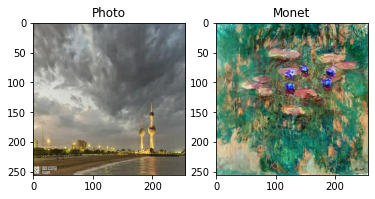

In [ ]:
plt.subplot(121)
plt.title("Photo")
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title("Monet")
plt.imshow(example_monet[0] * 0.5 + 0.5)

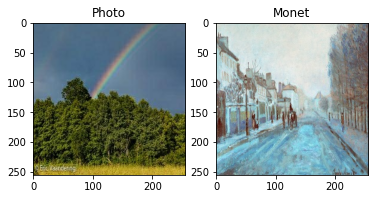

In [ ]:
example_monet = next(iter(monet_test_ds))
example_photo = next(iter(photo_test_ds))

plt.subplot(121)
plt.title("Photo")
plt.imshow(example_photo[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title("Monet")
plt.imshow(example_monet[0] * 0.5 + 0.5)

In [ ]:
# # Creating the generators and discriminators for the CycleGAN

# OUTPUT_CHANNELS = 3 # RGB channels

# generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm') # X -> Y
# generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm') # Y -> X

# discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False) # Dx
# discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False) # Dy

# # Optimizers
# generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
# generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
# discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

# Defining the loss functions

In [ ]:
LAMBDA = 10
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
# Discriminator loss
def discriminator_loss(real, generated):
    # Compares the real image with a matrix of ones, which is the ideal result
    real_loss = loss_obj(tf.ones_like(real), real)

    # Compares the generated image with a matrix of zeros, which is the ideal result 
    generated_loss = loss_obj(tf.zeros_like(generated), generated)

    total_disc_loss = real_loss + generated_loss

    return total_disc_loss * 0.5

In [ ]:
# Generator loss
def generator_loss(generated):
    # Compares the generated image with a matrix of ones.
    # The goal is to have a generated image as close to a real image as possible, i.e., close to a matrix of ones.
    return loss_obj(tf.ones_like(generated), generated)

In [ ]:
# Cycle consistency loss
def calc_cycle_loss(real_image, cycled_image):
    # Mean absolute error between the real image and the cycled image (generated back to the original domain)
    # Example:
    # real_image = X
    # cycled image = F(G(X)) = X_hat ~ X
    loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

    return LAMBDA * loss1

In [ ]:
# Identity loss
def identity_loss(real_image, same_image):
    # Mean absolute error between an image and its generator (i.e. a horse image with a horse image generator)
    loss = tf.reduce_mean(tf.abs(real_image - same_image))
    return LAMBDA * 0.5 * loss

# Creating the Model

In [ ]:
class CycleGan(keras.Model):
    def __init__(
        self,
        monet_generator,
        photo_generator,
        monet_discriminator,
        photo_discriminator,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        
    def compile(
        self,
        m_gen_optimizer,
        p_gen_optimizer,
        m_disc_optimizer,
        p_disc_optimizer,
        gen_loss_fn,
        disc_loss_fn,
        cycle_loss_fn,
        identity_loss_fn
    ):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # Generator G translates X -> Y
            # Generator F translates Y -> X.

            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # same_x and same_y are used for identity loss.
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet) + self.cycle_loss_fn(real_photo, cycled_photo)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss, self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss, self.p_gen.trainable_variables)

        monet_discriminator_gradients = tape.gradient(monet_disc_loss, self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss, self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients, self.m_gen.trainable_variables))
        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients, self.p_gen.trainable_variables))
        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients, self.m_disc.trainable_variables))
        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients, self.p_disc.trainable_variables))
        
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

In [ ]:
# Creating the generators and discriminators for the CycleGAN

OUTPUT_CHANNELS = 3 # RGB channels

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm') # X -> Y
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm') # Y -> X

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False) # Dx
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False) # Dy

# Optimizers
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
with strategy.scope():
    
    # monet_generator, photo_generator, monet_discriminator, photo_discriminator
    cycle_gan_model = CycleGan(
        generator_g, generator_f, discriminator_x, discriminator_y
    )

    cycle_gan_model.compile(
        m_gen_optimizer = generator_g_optimizer,
        p_gen_optimizer = generator_f_optimizer,
        m_disc_optimizer = discriminator_x_optimizer,
        p_disc_optimizer = discriminator_y_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

# Configurating a Checkpoint for the Model

In [ ]:
checkpoint_path = "/content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/checkpoints/120split_trainig.h5"

import os.path
print('Arquivo existe: ', os.path.exists(checkpoint_path))

Arquivo existe:  True


In [ ]:
try:
    cycle_gan_model.built = True
    cycle_gan_model.load_weights(filepath=checkpoint_path)
    print("Successfully loaded the model")

except:
    print("There is no checkpoint to load")

from keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint(checkpoint_path, monitor='monet_gen_loss', verbose=1,
    save_best_only=False, mode='min')

Successfully loaded the model


# Complete Training and Saving Improvement


In [ ]:
def generate_results(generator, dataset, title_source, title_target, buffer_size=1000, n_samples=5, random=True, save=False, path='', offset=0, figsize=(10, 30)):
    _, ax = plt.subplots(n_samples, 2, figsize=figsize)

    if (random):
        images = list(enumerate(dataset.shuffle(buffer_size=buffer_size).take(n_samples+offset)))[offset:]
    else:
        images = list(enumerate(dataset.take(n_samples+offset)))[offset:]

    for i, img in images:
        prediction = generator(img, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

        ax[i-offset, 0].imshow(img)
        ax[i-offset, 1].imshow(prediction)
        ax[i-offset, 0].set_title(title_source)
        ax[i-offset, 1].set_title(title_target)
        ax[i-offset, 0].axis("off")
        ax[i-offset, 1].axis("off")
    
    plt.show()
    
    if (save):
        plt.savefig(path)

In [ ]:
def save_images(generator, dataset, title_source, title_target, path, n_samples=5, offset=0):
    """ Function that create one file for each image on the dataset[0:n_samples] 
        
        path: file name
        example: path + _y.png
                         y: image index
    """

    for i, img in list(enumerate(dataset.take(n_samples+offset)))[offset:]:
        fig, ax = plt.subplots(1, 2)

        prediction = generator(img, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

        ax[0].imshow(img)
        ax[1].imshow(prediction)
        ax[0].set_title(title_source)
        ax[1].set_title(title_target)
        ax[0].axis("off")
        ax[1].axis("off")
    
        plt.savefig(path+'_'+str(i-offset))
        plt.close(fig)

In [ ]:
import json
import os

def append_record(record, path):
    with open(path, 'a') as f:
        json.dump(record, f)
        f.write(os.linesep)

In [ ]:
output_path = "/content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/output/"

# 120 epochs total
STEPS = 40
EPOCHS = 3
CONSTANT_EPOCHS = 0.67
VARIABLE_EPOCHS = 1 - CONSTANT_EPOCHS

adaptative_rate = np.repeat(2e-4, round(CONSTANT_EPOCHS * STEPS))
adaptative_rate = np.concatenate((adaptative_rate, np.linspace(2e-4, 0, round(VARIABLE_EPOCHS * STEPS)+1)), axis=None)

In [ ]:
OFFSET_EPOCH = 27
for step in range(OFFSET_EPOCH, STEPS):
    cycle_gan_model.m_gen_optimizer.learning_rate.assign(adaptative_rate[step])
    cycle_gan_model.p_gen_optimizer.learning_rate.assign(adaptative_rate[step])
    cycle_gan_model.m_disc_optimizer.learning_rate.assign(adaptative_rate[step])
    cycle_gan_model.p_disc_optimizer.learning_rate.assign(adaptative_rate[step])

    print("STEP: ", step)

    history = cycle_gan_model.fit(
        tf.data.Dataset.zip((monet_train_ds, photo_train_ds)),
        callbacks=[checkpoint],
        epochs=EPOCHS
    )

    # SAVE MODEL IMPROVEMENT
    append_record(history.history, output_path+'output_log.txt')
    # file path example: .../output/monetGen/file + _x + _y.png -> x: epoch, y: image index
    # uses the monet generator with photo samples
    save_images(generator_g, photo_train_ds, 'Epoch:'+str((step+1)*EPOCHS)+" Input Photo", "Generated Paiting", n_samples=5, path=output_path+'monetGenerator/m2p_'+str(step))
    # uses the monet generator with photo samples
    save_images(generator_f, monet_train_ds, 'Epoch:'+str((step+1)*EPOCHS)+" Input Painting", "Generated Photo", n_samples=5, offset=3, path=output_path+'photoGenerator/p2m_'+str(step))

    # backup save
    if (step % 2 == 0):
         cycle_gan_model.save_weights("/content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/checkpoints/ultimao_de_tudo.h5")

STEP:  27
Epoch 1/3
    956/Unknown - 646s 676ms/step - monet_gen_loss: 3.4995 - photo_gen_loss: 3.1274 - monet_disc_loss: 0.4410 - photo_disc_loss: 0.4759
Epoch 00001: saving model to /content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/checkpoints/120split_trainig.h5
956/956 [==============================] - 648s 678ms/step - monet_gen_loss: 3.5000 - photo_gen_loss: 3.1285 - monet_disc_loss: 0.4412 - photo_disc_loss: 0.4757
Epoch 2/3
956/956 [==============================] - ETA: 0s - monet_gen_loss: 3.6040 - photo_gen_loss: 3.1774 - monet_disc_loss: 0.4194 - photo_disc_loss: 0.4654
Epoch 00002: saving model to /content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/checkpoints/120split_trainig.h5
956/956 [==============================] - 651s 680ms/step - monet_gen_loss: 3.6051 - photo_gen_loss: 3.1779 - monet_disc_loss: 0.4193 - photo_disc_loss: 0.4652
Epoch 3/3
956/956 [==============================] - ETA: 0s - monet_gen_loss: 3.5447 - photo_gen_loss: 3.2056 - monet_di

In [ ]:
#  # SAVE MODEL IMPROVEMENT
# append_record(history.history, output_path+'output_log.txt')
# # file path example: .../output/monetGen/file + _x + _y.png -> x: epoch, y: image index
# # uses the monet generator with photo samples
# save_images(generator_g, photo_train_ds, 'Epoch:'+str((step+1)*EPOCHS)+" Input Photo", "Generated Paiting", n_samples=5, path=output_path+'monetGenerator/m2p_'+str(step))
# # uses the monet generator with photo samples
# save_images(generator_f, monet_train_ds, 'Epoch:'+str((step+1)*EPOCHS)+" Input Painting", "Generated Photo", n_samples=5, offset=3, path=output_path+'photoGenerator/p2m_'+str(step))

In [ ]:
 cycle_gan_model.save_weights("/content/drive/Shared drives/Equipe Rocket/8_Sem/Aplic AM/checkpoints/ultimao_de_tudo.h5")

# Showing Training results

## Samples from Training dataset

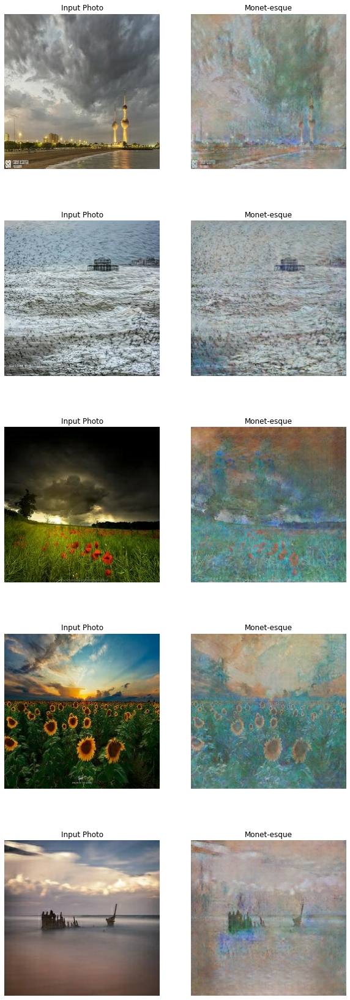

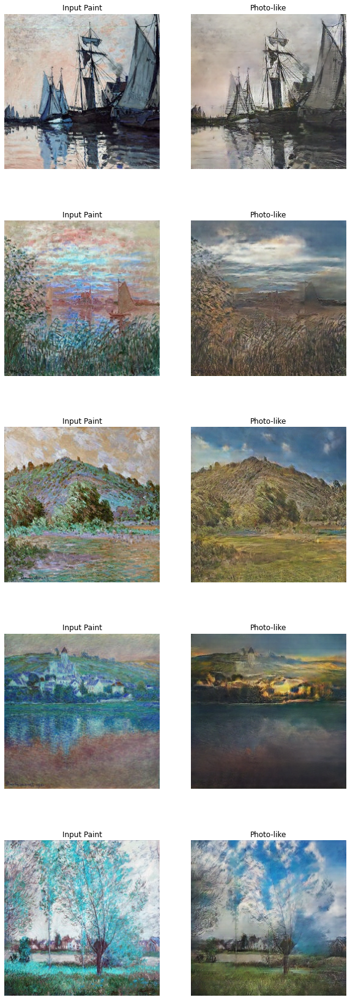

In [ ]:
# uses the monet generator with photo samples
generate_results(generator_g, photo_train_ds, "Input Photo", "Monet-esque", random=False, n_samples=5)
# uses the photo generator with monet paintings
generate_results(generator_f, monet_train_ds, "Input Paint", "Photo-like", random=False, n_samples=5, offset=3)

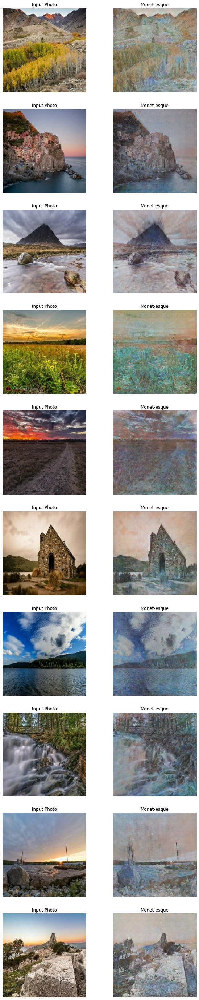

In [ ]:
# uses the monet generator with photo samples
generate_results(generator_g, photo_train_ds, "Input Photo", "Monet-esque", random=True, n_samples=10, figsize=(10, 50))

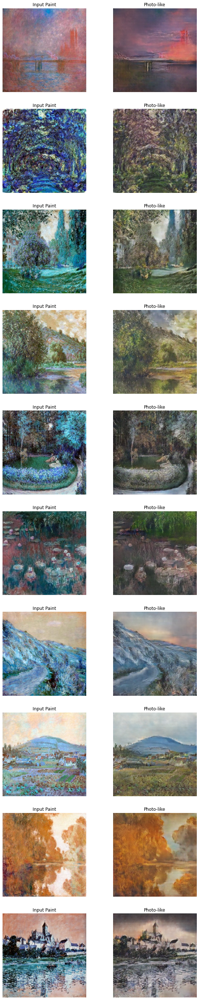

In [ ]:
# uses the photo generator with monet paintings
generate_results(generator_f, monet_train_ds, "Input Paint", "Photo-like", random=True, n_samples=10, figsize=(10,50))

## Samples from test dataset

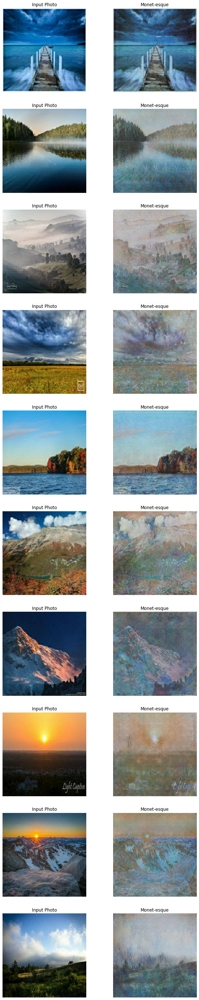

In [ ]:
generate_results(generator_g, photo_test_ds, "Input Photo", "Monet-esque", random=True, n_samples=10, figsize=(10, 50))

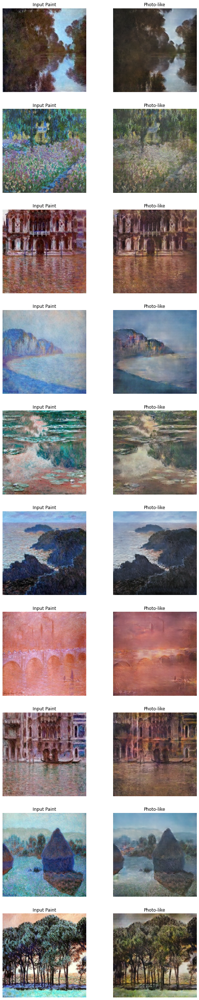

In [ ]:
generate_results(generator_f, monet_test_ds, "Input Paint", "Photo-like", random=True, n_samples=10, figsize=(10,50))

# Frechet Inception Distance (FID)



In [ ]:
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from scipy.linalg import sqrtm

In [ ]:
model_inception = InceptionV3(include_top=False, pooling='avg', input_shape= (256,256, 3))

In [ ]:
def calculate_fid(model, images_real, images_gen):
  act_real = model.predict(images_real)
  act_gen = model.predict(images_gen)

  mu_real, cov_real = act_real.mean(axis=0), np.cov(act_real, rowvar = False)
  mu_gen, cov_gen = act_gen.mean(axis=0), np.cov(act_gen, rowvar = False)
  ssdiff = np.sum((mu_real - mu_gen)**2.0)
  covmean = sqrtm(cov_real.dot(cov_gen))

  if np.iscomplexobj(covmean):
    covmean = covmean.real
   
  fid = ssdiff + np.trace(cov_real + cov_gen - 2.0 * covmean)
  return fid

In [ ]:
#images = list(enumerate(dataset.take(n_samples+offset)))[offset:]

# for i, img in images:
# prediction = generator(img, training=False)[0].numpy()
# prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
# img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

monet_ds = list(monet_test_ds.take(-1)) + list(monet_train_ds.take(-1))
monet_real = np.array([(img[0] * 127.5 + 127.5).numpy().astype(np.float32) for img in monet_ds])
display(monet_real.shape)

(1193, 256, 256, 3)

In [ ]:
photo_ds = list(photo_test_ds.take(-1)) + list(photo_train_ds.take(-1))
pred = []

for img in photo_ds:
  img_pred = generator_g(img, training = False)[0].numpy()
  img_pred = (img_pred * 127.5 + 127.5).astype(np.float32)
  pred.append(img_pred)

monet_gen = np.array([img for img in pred])


(1515, 256, 256, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


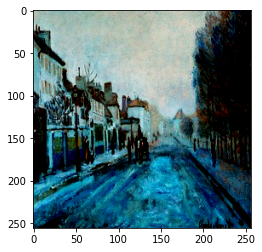

In [ ]:
display(monet_gen.shape)

plt.imshow(monet_real[0])
#plt.imshow(monet_gen[0])

In [ ]:
monet_gen = preprocess_input(monet_gen)
monet_real = preprocess_input(monet_real)

fid_dif = calculate_fid(model_inception, monet_real, monet_gen)

#print('FID: %.5f' %fid)
print('FID: %.5f' %fid_dif)

FID: 71.80912
